# **User Reviews using spaCY** 

**Objectives**
* Perform named entity recognition (NER) to extract product names and brands.
* Analyze sentiment (positive/negative) using a rule-based approach.

**Data Source**
[Amazon Product Reviews](https://www.kaggle.com/bittlingmayer/amazonreviews)

In [99]:
# Import libraries
import spacy
import bz2
import random

import pandas as pd
import matplotlib.pyplot as plt

from spacy import displacy
from tqdm import tqdm
from collections import Counter
from wordcloud import WordCloud

In [100]:
# Install small English model
nlp = spacy.load("en_core_web_sm")

In [101]:
# Import data
sample_size = 10000
lines = []

with bz2.open("/kaggle/input/amazonreviews/train.ft.txt.bz2", "rt", encoding="utf-8", errors="ignore") as f:
    for i, line in enumerate(f):
        if i < sample_size:
            lines.append(line.strip())
        else:
            j = random.randint(0, i)
            if j < sample_size:
                lines[j] = line.strip()

In [102]:
print(lines)

['__label__2 Incredible: I cannot believe no one has reviewed Gala\'s "Freed From Desire" yet. This techno vocal song was Europe\'s biggest hit in 1997. When I was over there I made sure to buy it, guessing (correctly) that it would not be available here. It just goes to show you that there is indeed a highly underrated international music scene. Gala, an Italian techno-diva, has also done several other good songs that are available as singles here. If you like euro-techno this is about as good as it gets.', "__label__1 Not his best: I'm a big fan of Keith Laumer, I've been reading his books since the 1960s. I love most of his work, but this is a very inferior example. I've been told that Keith Laumer had a stroke, and that this was written afterward. I can't verify that, but it sounds right. His sense of humor is all but gone, along with most if his timing, which is what usually drives his stories. This is an easy read, somewhat amusing, but I can't really recommend it. If you want La

In [103]:
docs = [nlp(line) for line in lines]
for doc in docs[:10]:
    print([token.text for token in doc])

# text = " ".join(lines)
# doc = nlp(text)

# docs = list(nlp.pipe(lines))

['_', '_', 'label__2', 'Incredible', ':', 'I', 'can', 'not', 'believe', 'no', 'one', 'has', 'reviewed', 'Gala', "'s", '"', 'Freed', 'From', 'Desire', '"', 'yet', '.', 'This', 'techno', 'vocal', 'song', 'was', 'Europe', "'s", 'biggest', 'hit', 'in', '1997', '.', 'When', 'I', 'was', 'over', 'there', 'I', 'made', 'sure', 'to', 'buy', 'it', ',', 'guessing', '(', 'correctly', ')', 'that', 'it', 'would', 'not', 'be', 'available', 'here', '.', 'It', 'just', 'goes', 'to', 'show', 'you', 'that', 'there', 'is', 'indeed', 'a', 'highly', 'underrated', 'international', 'music', 'scene', '.', 'Gala', ',', 'an', 'Italian', 'techno', '-', 'diva', ',', 'has', 'also', 'done', 'several', 'other', 'good', 'songs', 'that', 'are', 'available', 'as', 'singles', 'here', '.', 'If', 'you', 'like', 'euro', '-', 'techno', 'this', 'is', 'about', 'as', 'good', 'as', 'it', 'gets', '.']
['_', '_', 'label__1', 'Not', 'his', 'best', ':', 'I', "'m", 'a', 'big', 'fan', 'of', 'Keith', 'Laumer', ',', 'I', "'ve", 'been', 'r

In [104]:
for token in text.split()[:10]:
    print(token)

label__1
I
think
it
be
yoga
not
much
yoga
in


# **Sentence Boundary Detection**

In [105]:
# Sentence Boundary Detection
for doc in docs:
    for sent in doc.sents:
        print(sent.text)

__label__2 Incredible: I cannot believe no one has reviewed Gala's "Freed From Desire" yet.
This techno vocal song was Europe's biggest hit in 1997.
When I was over there I made sure to buy it, guessing (correctly) that it would not be available here.
It just goes to show you that there is indeed a highly underrated international music scene.
Gala, an Italian techno-diva, has also done several other good songs that are available as singles here.
If you like euro-techno this is about as good as it gets.
__label__1 Not his best: I'm a big fan of Keith Laumer, I've been reading his books since the 1960s.
I love most of his work, but this is a very inferior example.
I've been told that Keith Laumer had a stroke, and that this was written afterward.
I can't verify that, but it sounds right.
His sense of humor is all but gone, along with most if his timing, which is what usually drives his stories.
This is an easy read, somewhat amusing, but I can't really recommend it.
If you want Laumer at

# **Name Entity Recognition**

In [106]:
displacy.render(doc, style="ent")

In [107]:
# Use batch processing to extract products and brands using nlp.pipe
product_entities = []
brand_entities = []

for doc in tqdm(nlp.pipe(df["review"], batch_size=10000, n_process=-1)):
    products = [ent.text for ent in doc.ents if ent.label_ == "PRODUCT"]
    brands = [ent.text for ent in doc.ents if ent.label_ == "ORG"]
    
    product_entities.append(products)
    brand_entities.append(brands)

df["products"] = product_entities
df["brands"] = brand_entities

10000it [03:44, 44.61it/s]


In [108]:
# Check the output
df[["review", "products", "brands"]].head(10)

,review,products,brands
0,i thought it's yoga: not much yoga in this dvd...,[],[]
1,Rating this epilator very good but not excelle...,[],[]
2,It revealed a sad but realistic understanding ...,[],[]
3,Glad to see them get together... finally..: I'...,[],[]
4,Two Days I'll Never Get Back: Tom Shales and J...,[],"[SNL, SNL, Biography, A&E]"
5,great book!!!!: I have bought and given away 3...,[],[Sooooo]
6,Absolutely useless for XDA II Pocket PCs using...,[],"[Targus, Microsoft 2003]"
7,"VERY, VERY DULL.: This film has been described...",[],[MERLIN]
8,Plain and simple: This book changed my life fo...,[],[]
9,But it costs a lot ...: I bought a drill with ...,[],[]


In [109]:
# Identify most common products and brands
# Flatten lists
all_products = [p for plist in df["products"] for p in plist]
all_brands = [b for blist in df["brands"] for b in blist]

product_counts = Counter(all_products).most_common(15)
brand_counts = Counter(all_brands).most_common(15)

print("Most Common Products:")
for prod, count in product_counts:
    print(f"{prod}: {count}")

print("\nMost Common Brands:")
for brand, count in brand_counts:
    print(f"{brand}: {count}")

Most Common Products:
Classic: 22
Magic: 7
Photoshop: 6
Crystal: 6
F: 5
GameCube: 4
Cheap: 4
Romeo: 4
Shade: 4
Family: 3
TomTom: 3
Soltis: 3
TM 3 and 4: 3
Excel: 2
Millennium: 2

Most Common Brands:
Amazon: 432
Sony: 87
BUY: 44
Amazon.com: 41
Disney: 37
iPod: 37
USB: 32
VHS: 26
WOW: 25
Panasonic: 21
PBS: 18
un: 18
NEVER: 17
Vista: 17
HBO: 16


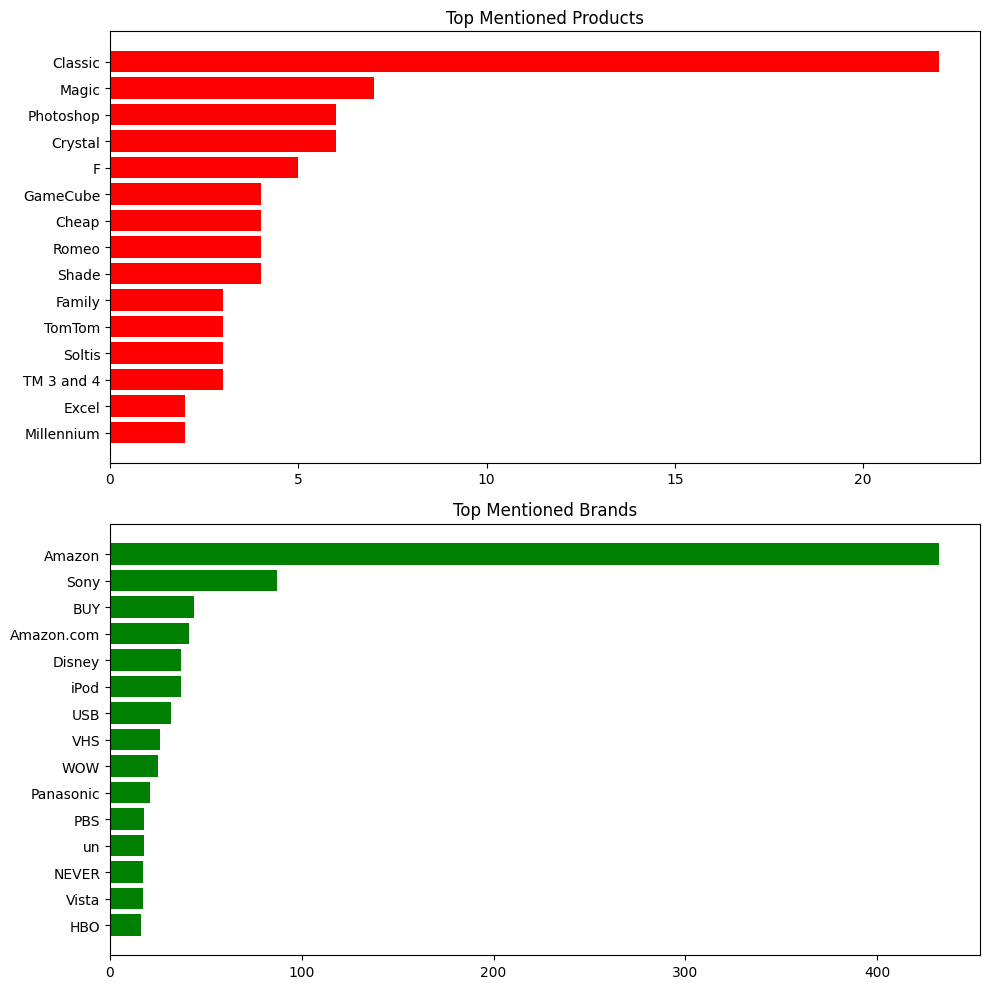

In [110]:
# Visualize top products and brands
# Convert to DataFrames
product_df = pd.DataFrame(product_counts, columns=["Product", "Count"])
brand_df = pd.DataFrame(brand_counts, columns=["Brand", "Count"])

# Visualizations
fig, axes = plt.subplots(2, 1, figsize=(10, 10))

axes[0].barh(product_df["Product"], product_df["Count"], color="red")
axes[0].invert_yaxis()
axes[0].set_title("Top Mentioned Products")

axes[1].barh(brand_df["Brand"], brand_df["Count"], color="green")
axes[1].invert_yaxis()
axes[1].set_title("Top Mentioned Brands")

plt.tight_layout()
plt.show();

# **Lemmatization**

In [111]:
# Lemma
lemma_per_review = []

for lem in docs:
    lemmas = [token.lemma_ for token in lem if not token.is_punct and not token.is_space]
    lemma_per_review.append(" ".join(lemmas))

In [112]:
# Convert a DataFrame
df = pd.DataFrame({
    "original_review": lines,
    "lemmatized_review": lemma_per_review
})

In [113]:
# Flatten all lemmas into a single list
all_lemmas = " ".join(df["lemmatized_review"]).split()

# Count frequencies
lemma_freq = Counter(all_lemmas)

# Convert to DataFrame for easy plotting
lemma_df = pd.DataFrame(lemma_freq.most_common(20), columns=["lemma", "count"])
lemma_df.head()

,lemma,count
0,the,39567
1,be,37079
2,I,25082
3,and,21338
4,a,20119


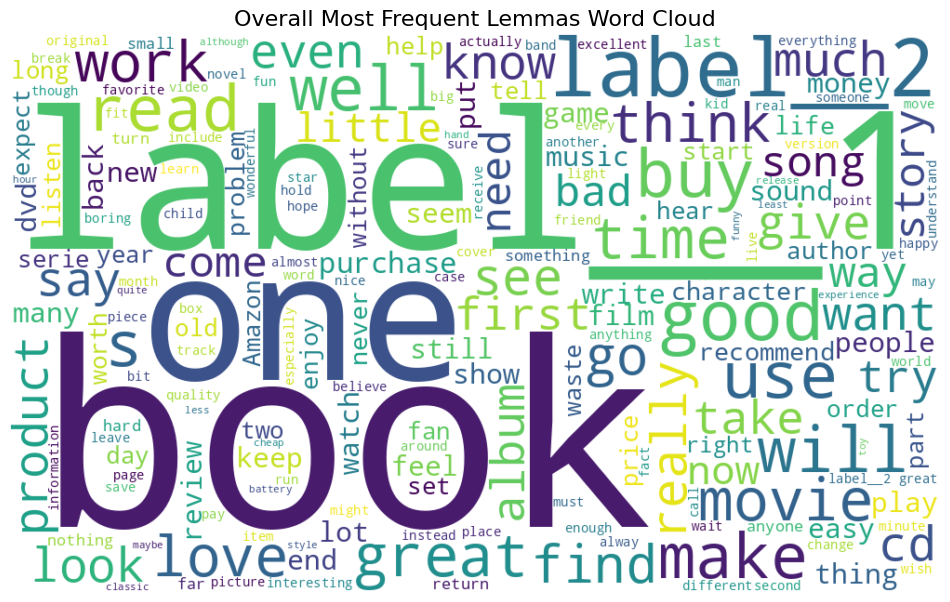

In [114]:
# Visualize the most frequent lemma via WordCloud
text = " ".join(all_lemmas)

wordcloud = WordCloud(width=1000, height=600, background_color="white").generate(text)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Overall Most Frequent Lemmas Word Cloud", fontsize=16)
plt.show();

In [115]:
# Split data into label and review text
data = []
for line in lines:
    parts = line.split(" ", 1)
    if len(parts) == 2:
        label = parts[0].replace("__label__", "")
        review = parts[1]
        data.append((label, review))

df = pd.DataFrame(data, columns=["label", "review"])
df["label"] = df["label"].astype(int)
df.head()

,label,review
0,2,Incredible: I cannot believe no one has review...
1,1,"Not his best: I'm a big fan of Keith Laumer, I..."
2,1,disappointed: I am disappointed with this iron...
3,2,great product; a life saver for travel: This i...
4,1,A self-exploration piece gone awry.: What I sa...


In [116]:
# Lemmatize reviews
lemmas_per_review = []

for doc in tqdm(nlp.pipe(df["review"], batch_size=100, n_process=-1)):
    lemmas = [
        token.lemma_.lower()
        for token in doc
        if not token.is_punct and not token.is_space and not token.is_stop
    ]
    lemmas_per_review.append(" ".join(lemmas))

df["lemmas"] = lemmas_per_review

10000it [01:30, 110.03it/s]


In [117]:
# Split data into positive and negative reviews 
pos_reviews = " ".join(df[df["label"] == 2]["lemmas"])
neg_reviews = " ".join(df[df["label"] == 1]["lemmas"])

In [118]:
# Compute lemma frequencies
pos_freq = Counter(pos_reviews.split())
neg_freq = Counter(neg_reviews.split())

# Top 50 lemmas for each sentiment
pos_top = pd.DataFrame(pos_freq.most_common(50), columns=["lemma", "count"])
neg_top = pd.DataFrame(neg_freq.most_common(50), columns=["lemma", "count"])

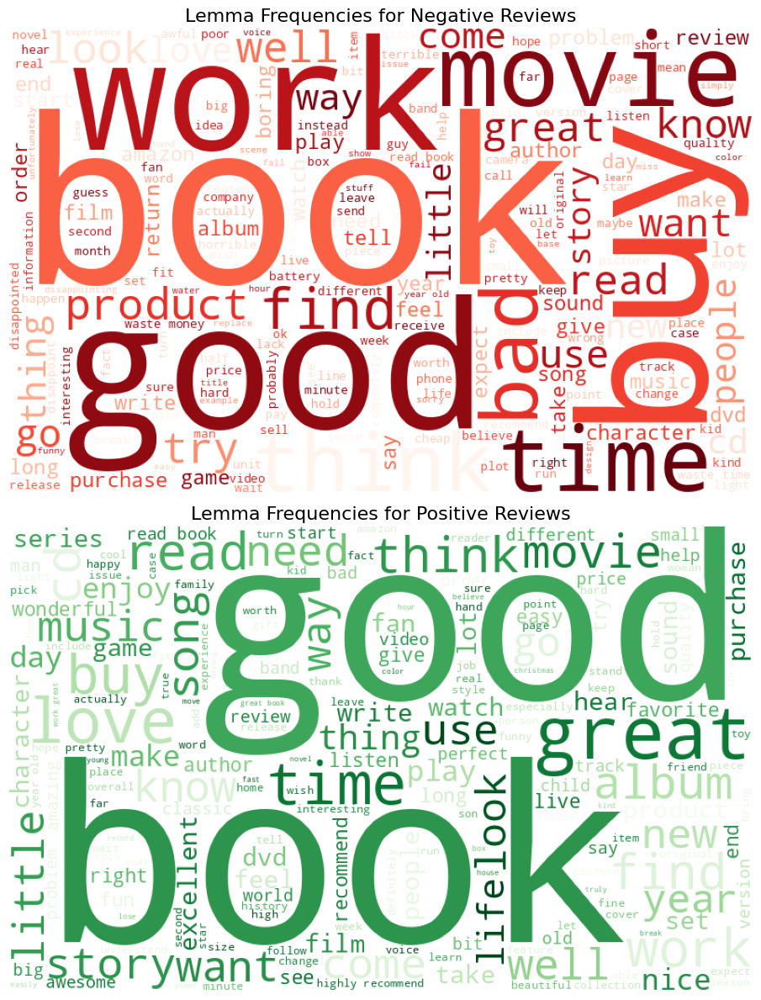

In [119]:
# Visualize Lemma Frequencies for Negative and Positive Reviews
fig, axes = plt.subplots(2, 1, figsize=(10, 12))

# Negative Reviews
axes[0].imshow(WordCloud(width=800, height=500, background_color="white", colormap="Reds").generate(neg_reviews))
axes[0].axis("off")
axes[0].set_title("Lemma Frequencies for Negative Reviews", fontsize=16)

plt.subplots_adjust(hspace=0.4)

# Positive Reviews
axes[1].imshow(WordCloud(width=800, height=500, background_color="white", colormap="Greens").generate(pos_reviews))
axes[1].axis("off")
axes[1].set_title("Lemma Frequencies for Positive Reviews", fontsize=16)

plt.tight_layout()
plt.show();

# **Reference** 
The notebook can be obtained from [Amazon User Review Solution Notebook](https://www.kaggle.com/code/chemutai254/userreview)